In [ ]:
!pip install tensorflow-addons
! pip install --upgrade tensorflow-hub

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 591.0/591.0 kB 31.5 MB/s eta 0:00:00


In [ ]:
!pip install tensorflow_text

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.0/6.0 MB 57.1 MB/s eta 0:00:00


In [ ]:
import tensorflow_text as text
import tensorflow as tf
import tensorflow_addons as tfa

/usr/local/lib/python3.10/dist-packages/tensorflow_addons/utils/tfa_eol_msg.py:23: UserWarning: 

TensorFlow Addons (TFA) has ended development and introduction of new features.
TFA has entered a minimal maintenance and release mode until a planned end of life in May 2024.
Please modify downstream libraries to take dependencies from other repositories in our TensorFlow community (e.g. Keras, Keras-CV, and Keras-NLP). 

For more information see: https://github.com/tensorflow/addons/issues/2807 

  warnings.warn(


In [ ]:
import os
import cv2
import gc
import numpy as np
import pandas as pd
import itertools
from tqdm.autonotebook import tqdm
import albumentations as A
import matplotlib.pyplot as plt

import collections
import json
import numpy as np
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
import tensorflow_hub as hub
import tensorflow_text as text
import tensorflow_addons as tfa
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from tqdm import tqdm
import pandas as pd
from sklearn.model_selection import train_test_split

import torch
from torch import nn
import torch.nn.functional as F

# Suppressing tf.hub warnings
tf.get_logger().setLevel("ERROR")
tfk = tf.keras
tfkl = tf.keras.layers

<ipython-input-4-56af5022f1b5>:7: TqdmExperimentalWarning: Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)
  from tqdm.autonotebook import tqdm


In [ ]:
!ls -lha kaggle.json
!pip install -q kaggle # installing the kaggle package
!mkdir -p ~/.kaggle # creating .kaggle folder where the key should be placed
!cp kaggle.json ~/.kaggle/ # move the key to the folder
!pwd # checking the present working directory

-rw-r--r-- 1 root root 65 Jul  6 07:19 kaggle.json
/content


In [ ]:
!chmod 600 ~/.kaggle/kaggle.json

In [ ]:
!kaggle datasets list



ref                                                                   title                                             size  lastUpdated          downloadCount  voteCount  usabilityRating  
--------------------------------------------------------------------  -----------------------------------------------  -----  -------------------  -------------  ---------  ---------------  
arnabchaki/data-science-salaries-2023                                 Data Science Salaries 2023 💸                      25KB  2023-04-13 09:55:16          41292       1197  1.0              
tawfikelmetwally/automobile-dataset                                   Car information dataset                            6KB  2023-05-28 18:26:48           7406        193  0.9411765        
fatihb/coffee-quality-data-cqi                                        Coffee Quality Data (CQI May-2023)                22KB  2023-05-12 13:06:39           8994        189  1.0              
mohithsairamreddy/salary-data                

In [ ]:
### For Flickr 8k
!kaggle datasets download -w adityajn105/flickr8k
!unzip flickr8k.zip
dataset = "8k"


### For Flickr 30k
# !kaggle datasets download -d hsankesara/flickr-image-dataset
# !unzip flickr-image-dataset.zip
# dataset = "30k"

Streaming output truncated to the last 5000 lines.
  inflating: Images/2844846111_8c1cbfc75d.jpg  
  inflating: Images/2844963839_ff09cdb81f.jpg  
  inflating: Images/2845246160_d0d1bbd6f0.jpg  
  inflating: Images/2845691057_d4ab89d889.jpg  
  inflating: Images/2845845721_d0bc113ff7.jpg  
  inflating: Images/2846037553_1a1de50709.jpg  
  inflating: Images/2846785268_904c5fcf9f.jpg  
  inflating: Images/2846843520_b0e6211478.jpg  
  inflating: Images/2847514745_9a35493023.jpg  
  inflating: Images/2847615962_c330bded6e.jpg  
  inflating: Images/2847859796_4d9cb0d31f.jpg  
  inflating: Images/2848266893_9693c66275.jpg  
  inflating: Images/2848571082_26454cb981.jpg  
  inflating: Images/2848895544_6d06210e9d.jpg  
  inflating: Images/2848977044_446a31d86e.jpg  
  inflating: Images/2849194983_2968c72832.jpg  
  inflating: Images/2850719435_221f15e951.jpg  
  inflating: Images/2851198725_37b6027625.jpg  
  inflating: Images/2851304910_b5721199bc.jpg  
  inflating: Images/2851931813_eaf8ed

In [ ]:
df = pd.read_csv("/content/captions.txt")
df['id'] = [id_ for id_ in range(df.shape[0] // 5) for _ in range(5)]
df.to_csv("captions.csv", index=False)
df = pd.read_csv("captions.csv")
df.head()

,image,caption,id
0,1000268201_693b08cb0e.jpg,A child in a pink dress is climbing up a set o...,0
1,1000268201_693b08cb0e.jpg,A girl going into a wooden building .,0
2,1000268201_693b08cb0e.jpg,A little girl climbing into a wooden playhouse .,0
3,1000268201_693b08cb0e.jpg,A little girl climbing the stairs to her playh...,0
4,1000268201_693b08cb0e.jpg,A little girl in a pink dress going into a woo...,0


In [ ]:
class CFG:
    debug = False
    image_path = "/content/Images"
    captions_path = "."
    batch_size = 32
    num_workers = 4
    head_lr = 1e-3
    image_encoder_lr = 1e-4
    text_encoder_lr = 1e-5
    weight_decay = 1e-3
    patience = 1
    factor = 0.8
    epochs = 2
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

    model_name = 'resnet50'
    image_embedding = 2048
    text_encoder_model = "distilbert-base-uncased"
    text_embedding = 768
    text_tokenizer = "distilbert-base-uncased"
    max_length = 200

    pretrained = True # for both image encoder and text encoder
    trainable = True # for both image encoder and text encoder
    temperature = 1.0

    # image size
    size = 224

    # for projection head; used for both image and text encoders
    num_projection_layers = 1
    projection_dim = 256
    dropout = 0.1

In [ ]:
import tensorflow as tf
import cv2

class CLIPDataset(tf.keras.utils.Sequence):
    def __init__(self, image_filenames, captions, batch_size=16):
        """
        image_filenames and captions must have the same length; so, if there are
        multiple captions for each image, the image_filenames must have repetitive
        file names
        """

        self.image_filenames = image_filenames
        self.captions = list(captions)
        self.batch_size = batch_size
        self.preprocessor = hub.KerasLayer(
        "https://tfhub.dev/tensorflow/bert_en_uncased_preprocess/3")

    def __len__(self):
        return len(self.image_filenames) // self.batch_size

    def __getitem__(self, idx):
        batch_image_filenames = self.image_filenames[idx*self.batch_size:(idx+1)*self.batch_size]
        batch_captions = self.captions[idx*self.batch_size:(idx+1)*self.batch_size]

        batch_images = []
        for filename in batch_image_filenames:
            image = cv2.imread(f"{CFG.image_path}/{filename}")
            image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
            image = cv2.resize(image, (100, 100))
            batch_images.append(image)

        batch_items = {}
        batch_items['image'] = tf.stack(batch_images)
        batch_items['caption'] = tf.constant(batch_captions)


        return batch_items

In [ ]:
def make_train_valid_dfs():
    dataframe = pd.read_csv(f"{CFG.captions_path}/captions.csv")
    max_id = dataframe["id"].max() + 1 if not CFG.debug else 100
    image_ids = np.arange(0, max_id)
    np.random.seed(42)
    valid_ids = np.random.choice(
        image_ids, size=int(0.2 * len(image_ids)), replace=False
    )
    train_ids = [id_ for id_ in image_ids if id_ not in valid_ids]
    train_dataframe = dataframe[dataframe["id"].isin(train_ids)].reset_index(drop=True)
    valid_dataframe = dataframe[dataframe["id"].isin(valid_ids)].reset_index(drop=True)
    return train_dataframe, valid_dataframe

In [ ]:
train_df, valid_df = make_train_valid_dfs()

In [ ]:
'''
def project_embeddings(
    embeddings, num_projection_layers=1, projection_dim=512, dropout_rate=CFG.dropout
):
    projected_embeddings = layers.Dense(units=projection_dim)(embeddings)
    for _ in range(num_projection_layers):
        x = tf.nn.gelu(projected_embeddings)
        x = layers.Dense(projection_dim)(x)
        x = layers.Dropout(dropout_rate)(x)
        x = layers.Add()([projected_embeddings, x])
        projected_embeddings = layers.LayerNormalization()(x)
    return projected_embeddings
'''

'\ndef project_embeddings(\n    embeddings, num_projection_layers=1, projection_dim=512, dropout_rate=CFG.dropout\n):\n    projected_embeddings = layers.Dense(units=projection_dim)(embeddings)\n    for _ in range(num_projection_layers):\n        x = tf.nn.gelu(projected_embeddings)\n        x = layers.Dense(projection_dim)(x)\n        x = layers.Dropout(dropout_rate)(x)\n        x = layers.Add()([projected_embeddings, x])\n        projected_embeddings = layers.LayerNormalization()(x)\n    return projected_embeddings\n'

In [ ]:
import tensorflow as tf
from tensorflow.keras import layers

class ProjectionHead(tf.keras.Model):
    def __init__(
        self,
        embedding_dim,
        projection_dim=CFG.projection_dim,
        dropout=CFG.dropout
    ):
        super(ProjectionHead, self).__init__()

        self.projection = tf.keras.layers.Dense(projection_dim)
        self.gelu = tf.keras.layers.Activation(tf.nn.gelu)
        self.fc = tf.keras.layers.Dense(projection_dim)
        self.dropout = tf.keras.layers.Dropout(dropout)
        self.layer_norm = tf.keras.layers.LayerNormalization()

    def call(self, x):
        projected = self.projection(x)
        x = self.gelu(projected)
        x = self.fc(x)
        x = self.dropout(x)
        x = x + projected
        x = self.layer_norm(x)
        return x

In [ ]:
'''
def create_vision_encoder(trainable=True):
    # Load the pre-trained Xception model to be used as the base encoder.
    resnet = tf.keras.applications.resnet.ResNet50(
        include_top=False, weights='imagenet', pooling="avg"
    )
    #resnet.load_weights(checkpoint_path)
    # Set the trainability of the base encoder.
    for layer in resnet.layers:
        layer.trainable = trainable
    # Receive the images as inputs.
    inputs = layers.Input(shape=(100, 100, 3), name="image_input")
    # Preprocess the input image.
    resnet_input = tf.keras.applications.resnet.preprocess_input(inputs)
    # Generate the embeddings for the images using the xception model.
    embeddings = resnet(resnet_input)

    outputs = project_embeddings(embeddings)

    # Create the vision encoder model.
    return keras.Model(inputs, outputs, name="vision_encoder")

'''

'\ndef create_vision_encoder(trainable=True):\n    # Load the pre-trained Xception model to be used as the base encoder.\n    resnet = tf.keras.applications.resnet.ResNet50(\n        include_top=False, weights=\'imagenet\', pooling="avg"\n    )\n    #resnet.load_weights(checkpoint_path)\n    # Set the trainability of the base encoder.\n    for layer in resnet.layers:\n        layer.trainable = trainable\n    # Receive the images as inputs.\n    inputs = layers.Input(shape=(100, 100, 3), name="image_input")\n    # Preprocess the input image.\n    resnet_input = tf.keras.applications.resnet.preprocess_input(inputs)\n    # Generate the embeddings for the images using the xception model.\n    embeddings = resnet(resnet_input)\n\n    outputs = project_embeddings(embeddings)\n\n    # Create the vision encoder model.\n    return keras.Model(inputs, outputs, name="vision_encoder")\n\n'

In [ ]:
class VisionEncoder(tf.keras.Model):
    def __init__(self, trainable=True):
        super(VisionEncoder, self).__init__()

        # Load the pre-trained ResNet50 model to be used as the base encoder.
        self.resnet = tf.keras.applications.ResNet50(
            include_top=False, weights='imagenet', pooling="avg"
        )
        # Set the trainability of the base encoder.
        for layer in self.resnet.layers:
            layer.trainable = trainable

    def call(self, inputs):
        # Preprocess the input image.
        resnet_input = tf.keras.applications.resnet.preprocess_input(inputs)
        # Generate the embeddings for the images using the ResNet50 model.
        embeddings = self.resnet(resnet_input)

        return embeddings

In [ ]:
'''
def create_text_encoder(
    model_name=CFG.text_encoder_model, pretrained=CFG.pretrained, trainable=CFG.trainable
):
    text_input = tf.keras.layers.Input(shape=(), dtype=tf.string)
    preprocessor = hub.KerasLayer(
        "https://tfhub.dev/tensorflow/bert_en_uncased_preprocess/3")
    encoder_inputs = preprocessor(text_input)
    encoder = hub.KerasLayer(
        "https://tfhub.dev/tensorflow/bert_en_uncased_L-12_H-768_A-12/4",
        trainable=True)
    outputs = encoder(encoder_inputs)
    pooled_output = outputs["pooled_output"]      # [batch_size, 768].
    sequence_output = outputs["sequence_output"]  # [batch_size, seq_length, 768].
    outputs = project_embeddings(pooled_output)

    embedding_model = tf.keras.Model(text_input, outputs)
    # Create the text encoder model.
    return embedding_model

'''

'\ndef create_text_encoder(\n    model_name=CFG.text_encoder_model, pretrained=CFG.pretrained, trainable=CFG.trainable\n):\n    text_input = tf.keras.layers.Input(shape=(), dtype=tf.string)\n    preprocessor = hub.KerasLayer(\n        "https://tfhub.dev/tensorflow/bert_en_uncased_preprocess/3")\n    encoder_inputs = preprocessor(text_input)\n    encoder = hub.KerasLayer(\n        "https://tfhub.dev/tensorflow/bert_en_uncased_L-12_H-768_A-12/4",\n        trainable=True)\n    outputs = encoder(encoder_inputs)\n    pooled_output = outputs["pooled_output"]      # [batch_size, 768].\n    sequence_output = outputs["sequence_output"]  # [batch_size, seq_length, 768].\n    outputs = project_embeddings(pooled_output)\n\n    embedding_model = tf.keras.Model(text_input, outputs)\n    # Create the text encoder model.\n    return embedding_model\n\n'

In [ ]:
class TextEncoder(tf.keras.Model):
    def __init__(self, model_name=CFG.text_encoder_model, pretrained=CFG.pretrained, trainable=CFG.trainable):
        super(TextEncoder, self).__init__()
        self.preprocessor = hub.KerasLayer("https://tfhub.dev/tensorflow/bert_en_uncased_preprocess/3")
        self.encoder = hub.KerasLayer("https://tfhub.dev/tensorflow/bert_en_uncased_L-12_H-768_A-12/4", trainable=trainable)
        self.target_token_idx = 0

    def call(self, inputs):
        encoder_inputs = self.preprocessor(inputs)
        outputs = self.encoder(encoder_inputs)
        pooled_output = outputs["pooled_output"]
        return pooled_output

In [ ]:
class DualEncoder(tfk.Model):
    def __init__(self, text_encoder, image_encoder, temperature=CFG.temperature, image_embedding=CFG.image_embedding, text_embedding=CFG.text_embedding, **kwargs):
        super(DualEncoder, self).__init__(**kwargs)
        self.text_encoder = text_encoder
        self.image_encoder = image_encoder
        self.image_projection = ProjectionHead(embedding_dim=image_embedding)
        self.text_projection = ProjectionHead(embedding_dim=text_embedding)
        self.temperature = temperature

    def call(self, inputs):
        # Getting Image and Text inputs
        with tf.device("/gpu:0"):
            image_embeddings = self.image_encoder(inputs['image'])
            image_embeddings = self.image_projection(image_embeddings)
        with tf.device("/gpu:1"):
            text_embeddings = self.text_encoder(inputs['caption'])
            text_embeddings = self.text_projection(text_embeddings)
        return image_embeddings, text_embeddings

In [ ]:
def get_ground_truth(num_logits):
    labels = tf.range(num_logits, dtype=tf.int32)
    return labels

def get_logits(image_features, text_features, logit_scale=0.7):
    logits_per_image = logit_scale * tf.matmul(image_features, text_features, transpose_b=True)
    logits_per_text = logit_scale * tf.matmul(text_features, image_features, transpose_b=True)
    return logits_per_image, logits_per_text

def clip_loss(image_features, text_features, logit_scale, output_dict=False):
    logits_per_image, logits_per_text = get_logits(image_features, text_features, logit_scale)
    labels = get_ground_truth(logits_per_image.shape[0])
    total_loss = (
        tf.reduce_mean(tf.keras.metrics.sparse_categorical_crossentropy(y_true=labels, y_pred=logits_per_image, from_logits=True)) +
        tf.reduce_mean(tf.keras.metrics.sparse_categorical_crossentropy(y_true=labels, y_pred=logits_per_text, from_logits=True))
    ) / 2
    if output_dict:
        return {"contrastive_loss": total_loss}
    else:
        return total_loss

In [ ]:
'''
def compute_loss(caption_embeddings, image_embeddings):

        #caption_embeddings = tf.math.l2_normalize(caption_embeddings, axis=1)
        #image_embeddings = tf.math.l2_normalize(image_embeddings, axis=1)

        logits = (
            tf.matmul(caption_embeddings, image_embeddings, transpose_b=True)
        )
        labels = tf.eye(logits.shape[0],logits.shape[1])
        loss_images =  tf.math.reduce_mean(tf.keras.metrics.binary_crossentropy(y_true=labels,y_pred=logits,from_logits=True))
        loss_texts =  tf.math.reduce_mean(tf.keras.metrics.binary_crossentropy(y_true=tf.transpose(labels),y_pred=tf.transpose(logits),from_logits=True))
        loss = 0.5 * (loss_images + loss_texts)
        return loss
'''

'\ndef compute_loss(caption_embeddings, image_embeddings):\n\n        #caption_embeddings = tf.math.l2_normalize(caption_embeddings, axis=1)\n        #image_embeddings = tf.math.l2_normalize(image_embeddings, axis=1)\n\n        logits = (\n            tf.matmul(caption_embeddings, image_embeddings, transpose_b=True)\n        )\n        labels = tf.eye(logits.shape[0],logits.shape[1])\n        loss_images =  tf.math.reduce_mean(tf.keras.metrics.binary_crossentropy(y_true=labels,y_pred=logits,from_logits=True))\n        loss_texts =  tf.math.reduce_mean(tf.keras.metrics.binary_crossentropy(y_true=tf.transpose(labels),y_pred=tf.transpose(logits),from_logits=True))\n        loss = 0.5 * (loss_images + loss_texts)\n        return loss\n'

In [ ]:
vision_encoder = VisionEncoder()
text_encoder = TextEncoder()

model = DualEncoder(text_encoder, vision_encoder)
model.compile(
    optimizer=tfa.optimizers.AdamW(learning_rate=0.00001, weight_decay=0)
)

94765736/94765736 [==============================] - 7s 0us/step


In [ ]:
optimizer = tfa.optimizers.AdamW(learning_rate=0.00001, weight_decay=0)

In [ ]:
train_dataset = CLIPDataset(
        train_df["image"].values,
        train_df["caption"].values
    )

In [ ]:
valid_dataset = CLIPDataset(
        valid_df["image"].values,
        valid_df["caption"].values    )

In [ ]:
loss_values = []

In [ ]:
for epoch in range(5):
    step = 0
    patience = 0
    pre_loss = 0
    loss_value = 0
    for batch in train_dataset:
        pre_loss = loss_value
        with tf.GradientTape() as tape:
            image_embeddings, text_embeddings = model(batch)
            loss_value = clip_loss(image_embeddings, text_embeddings, logit_scale=1)
            loss_values.append(loss_value)

        grads = tape.gradient(loss_value, model.trainable_weights)
        # Run one step of gradient descent by updating
        # the value of the variables to minimize the loss.
        optimizer.apply_gradients(zip(grads, model.trainable_weights))
        step +=1
        # Log every 200 batches
        if step % 1 == 0:
            print("Training loss (for one batch) at step %d: %.4f"% (step, loss_value))

Training loss (for one batch) at step 1: 9.4906
Training loss (for one batch) at step 2: 8.9069
Training loss (for one batch) at step 3: 6.8616
Training loss (for one batch) at step 4: 9.8808
Training loss (for one batch) at step 5: 7.0907
Training loss (for one batch) at step 6: 4.2431
Training loss (for one batch) at step 7: 4.9915
Training loss (for one batch) at step 8: 6.1654
Training loss (for one batch) at step 9: 5.9703
Training loss (for one batch) at step 10: 8.4420
Training loss (for one batch) at step 11: 6.8142
Training loss (for one batch) at step 12: 7.6820
Training loss (for one batch) at step 13: 8.1880
Training loss (for one batch) at step 14: 7.0010
Training loss (for one batch) at step 15: 4.7214
Training loss (for one batch) at step 16: 4.9970
Training loss (for one batch) at step 17: 11.2101
Training loss (for one batch) at step 18: 5.1262
Training loss (for one batch) at step 19: 9.0549
Training loss (for one batch) at step 20: 6.0545
Training loss (for one batch

KeyboardInterrupt: ignored

In [ ]:
valid_image_embeddings = []
valid_caption_embeddings = []
for batch in valid_dataset:
    image_embeddings, text_embeddings = model(batch)
    valid_image_embeddings.append(image_embeddings)
    valid_caption_embeddings.append(text_embeddings)

In [ ]:
valid_original_images = []
valid_original_captions = []
for batch in valid_dataset:
    valid_original_images.append(batch["image"])
    valid_original_captions.append(batch["caption"])

In [ ]:
def find_matches(model, image_embeddings, query, image_filenames, n=9):
    text_features = model.text_encoder(tf.constant([query]))
    text_embeddings = model.text_projection(text_features)

    #Normalize image embeddings
    image_embeddings_n = tf.math.l2_normalize(tf.concat(valid_image_embeddings, axis=0), axis=-1)

    # Normalize text embeddings
    text_embeddings_n = tf.math.l2_normalize(text_embeddings, axis=-1)

    # Calculate dot similarity between text and image embeddings
    dot_similarity = tf.matmul(text_embeddings_n, image_embeddings_n, transpose_b=True)

    # Get top n * 5 matches
    values, indices = tf.math.top_k(tf.squeeze(dot_similarity), k=n * 5)
    matches = [image_filenames[idx] for idx in indices[::5]]

    _, axes = plt.subplots(3, 3, figsize=(10, 10))
    for match, ax in zip(matches, axes.flatten()):
        image = cv2.imread(f"{CFG.image_path}/{match}")
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        ax.imshow(image)
        ax.axis("off")

    plt.show()

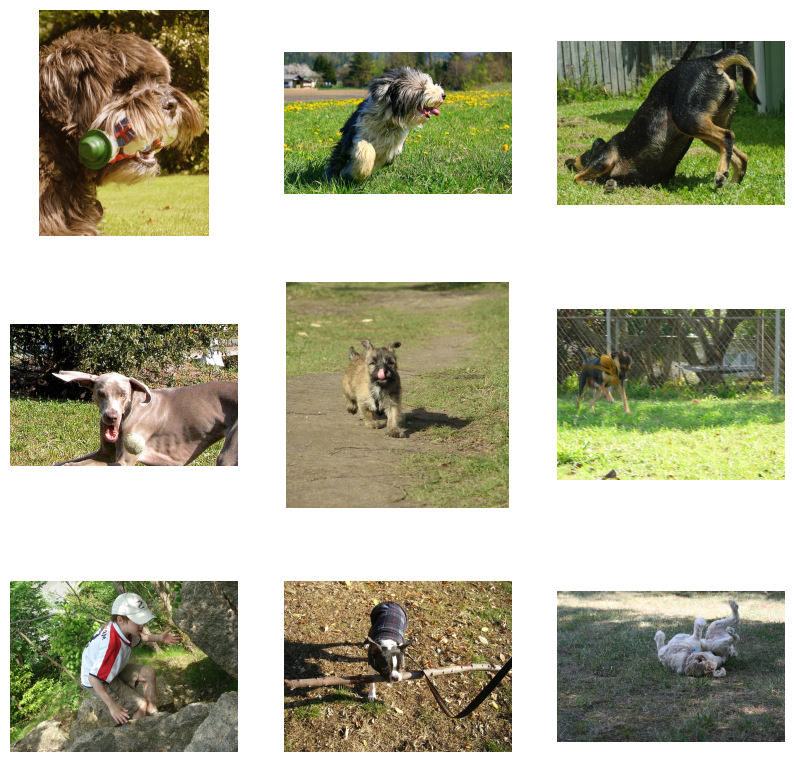

In [ ]:
find_matches(model, valid_image_embeddings, query="dogs on the grass", image_filenames=valid_df['image'].values, n=9)

In [ ]:
model.save_weights("output")

## Zero-shot Learning

In [ ]:
from torchvision.datasets import CIFAR100
import os

cifar100 = CIFAR100(os.path.expanduser("~/.cache"), download=True)

100%|██████████| 169001437/169001437 [00:12<00:00, 13081062.97it/s]


Extracting /root/.cache/cifar-100-python.tar.gz to /root/.cache


In [ ]:
text_descriptions = [f"A photo of a {label}" for label in cifar100.classes]

In [ ]:
def get_label_embeddings(text_descriptions):
    text_features = model.text_encoder(text_descriptions)
    text_embeddings = model.text_projection(text_features)
    return text_embeddings

In [ ]:
label_embeddings = get_label_embeddings(text_descriptions)

In [ ]:
#Normalize image embeddings
image_embeddings_n = tf.math.l2_normalize(tf.concat(valid_image_embeddings, axis=0), axis=-1)
# Normalize text embeddings
label_embeddings_n = tf.math.l2_normalize(label_embeddings, axis=-1)

In [ ]:
text_probs = keras.activations.softmax(tf.matmul(image_embeddings_n, label_embeddings_n, transpose_b=True) * 100.0)
top_probs, top_indices = tf.math.top_k(text_probs, k=5)

In [ ]:
top_probs

<tf.Tensor: shape=(8080, 5), dtype=float32, numpy=
array([[0.0174434 , 0.01719742, 0.01716437, 0.01664681, 0.01646961],
       [0.0174434 , 0.01719742, 0.01716437, 0.01664681, 0.01646961],
       [0.0174434 , 0.01719742, 0.01716437, 0.01664681, 0.01646961],
       ...,
       [0.02373356, 0.02119005, 0.02095234, 0.02060863, 0.01975683],
       [0.02373356, 0.02119005, 0.02095234, 0.02060863, 0.01975683],
       [0.02373356, 0.02119005, 0.02095234, 0.02060863, 0.01975683]],
      dtype=float32)>

In [ ]:
image_filenames = valid_df['image'].values

ValueError: ignored

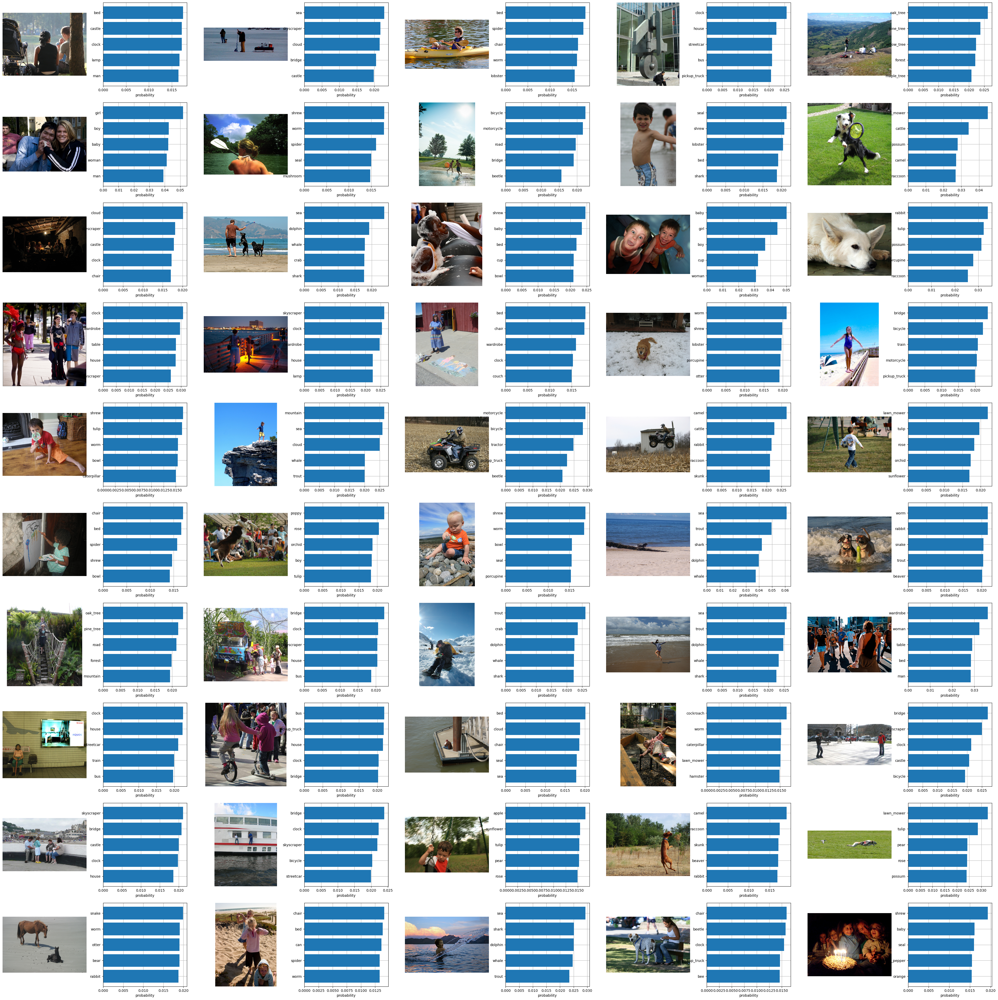

In [ ]:
fig = plt.figure(figsize=(50, 50))  # Set the desired figure size
pre_element = "nothing"
counter = 0
for i, element in enumerate(image_filenames):
    if pre_element != element:
      pre_element = element
      image = cv2.imread(f"{CFG.image_path}/{element}")
      image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
      plt.subplot(10, 10, 2 * counter + 1)
      plt.imshow(image)
      plt.axis("off")

      plt.subplot(10, 10, 2 * counter + 2)
      y = np.arange(top_probs.shape[-1])
      plt.grid()
      plt.barh(y, top_probs[i].numpy())
      plt.gca().invert_yaxis()
      plt.gca().set_axisbelow(True)
      plt.yticks(y, [cifar100.classes[index] for index in top_indices[i].numpy()])
      plt.xlabel("probability")
      counter += 1
    else:
      continue

plt.subplots_adjust(wspace=0.5)
plt.show()

In [43]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [44]:
!cp -r "/content/output.data-00000-of-00001" /content/gdrive/MyDrive/